In [1]:
# ===== Snippet 1: Imports & basic setup =====

import os
import cv2
import math
import random
import numpy as np
import pandas as pd

from tqdm import tqdm
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T

# Reproducibility
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

set_seed(42)

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# Paths (as provided)
CSV_PATH = "/kaggle/input/taska-ultrasound/dataset_taskA/role_challenge_dataset_ground_truth.csv"
IMAGE_DIR = "/kaggle/input/taska-ultrasound/dataset_taskA/images"


Using device: cuda


In [2]:
# ===== EDA 1: Load CSV and inspect =====
import pandas as pd

df = pd.read_csv(CSV_PATH)
df.head(), df.describe()


(   image_name  ofd_1_x  ofd_1_y  ofd_2_x  ofd_2_y  bpd_1_x  bpd_1_y  bpd_2_x  \
 0  000_HC.png      361       12      339      530      481       16      664   
 1  001_HC.png      441      331      368      308      297      247      534   
 2  002_HC.png      318      374      154      406      481      158      558   
 3  003_HC.png      424      105      407      462      305      349      547   
 4  004_HC.png      300      277      611      534       53      452      494   
 
    bpd_2_y  
 0      318  
 1      142  
 2      215  
 3      363  
 4      308  ,
           ofd_1_x     ofd_1_y     ofd_2_x     ofd_2_y     bpd_1_x     bpd_1_y  \
 count  622.000000  622.000000  622.000000  622.000000  622.000000  622.000000   
 mean   393.456592  121.631833  389.681672  431.083601  202.736334  274.374598   
 std     75.909815   98.286353   99.369648   76.089527  116.856373   75.128164   
 min    112.000000    7.000000   18.000000    9.000000    6.000000    9.000000   
 25%    359.50000

In [3]:
# ===== EDA 2: Missing image check =====
import os

df['exists'] = df['image_name'].apply(lambda x: os.path.isfile(os.path.join(IMAGE_DIR, x)))
missing_imgs = df[~df['exists']]
print(f"Missing images: {len(missing_imgs)}")


Missing images: 0


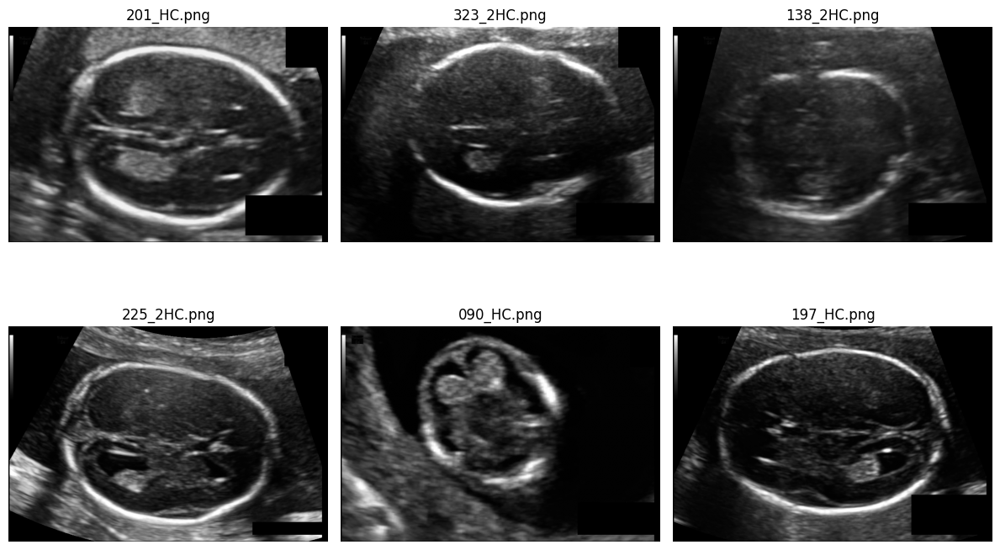

In [4]:
# ===== EDA 3: Display random sample images =====
import matplotlib.pyplot as plt
import cv2
import random

samples = df.sample(6)

plt.figure(figsize=(12,8))
for i, row in enumerate(samples.itertuples()):
    img = cv2.imread(os.path.join(IMAGE_DIR, row.image_name), 0)
    plt.subplot(2, 3, i+1)
    plt.imshow(img, cmap="gray")
    plt.title(row.image_name)
    plt.axis("off")
plt.tight_layout()
plt.show()


Computing stats: 100%|██████████| 622/622 [00:04<00:00, 143.91it/s]


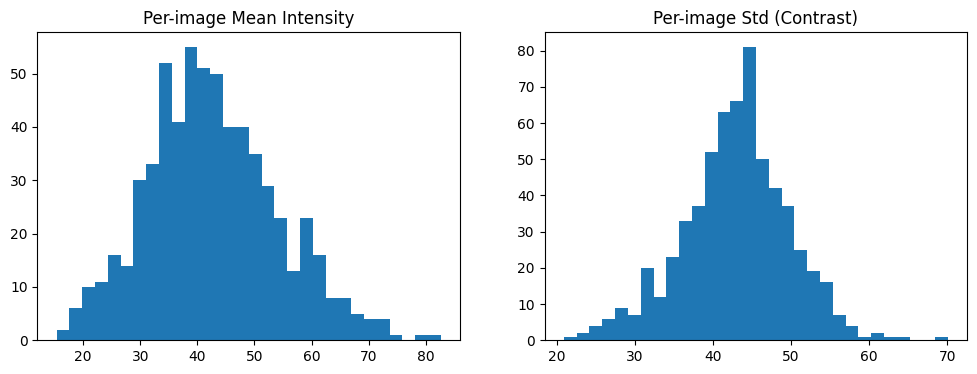

Mean intensity range: 15.3 – 82.7
Std (contrast) range: 20.9 – 70.1


In [19]:
# ===== EDA 2.2: Per-image intensity statistics =====

means = []
stds = []

for img_name in tqdm(df["image_name"], desc="Computing stats"):
    img = cv2.imread(os.path.join(IMAGE_DIR, img_name), cv2.IMREAD_GRAYSCALE)
    if img is not None:
        means.append(img.mean())
        stds.append(img.std())

plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
plt.hist(means, bins=30)
plt.title("Per-image Mean Intensity")

plt.subplot(1,2,2)
plt.hist(stds, bins=30)
plt.title("Per-image Std (Contrast)")

plt.show()

print(f"Mean intensity range: {min(means):.1f} – {max(means):.1f}")
print(f"Std (contrast) range: {min(stds):.1f} – {max(stds):.1f}")


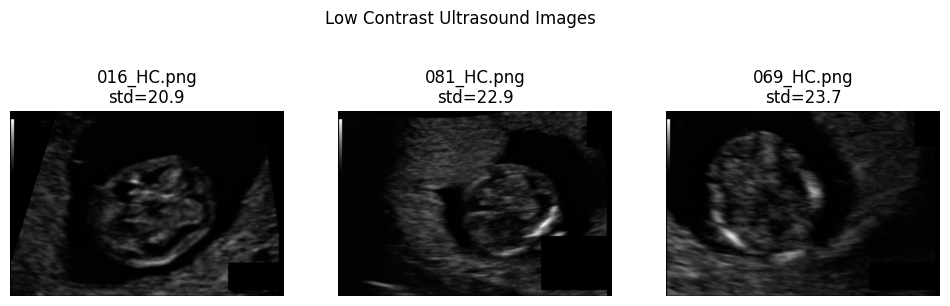

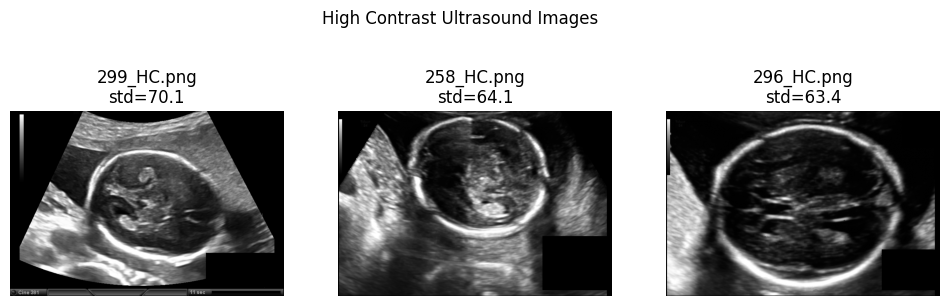

In [20]:
# ===== EDA 2.3: Visualize contrast extremes =====

stats_df = pd.DataFrame({
    "image_name": df["image_name"],
    "mean": means,
    "std": stds
})

low_contrast = stats_df.nsmallest(3, "std")
high_contrast = stats_df.nlargest(3, "std")

def show_images(image_list, title):
    plt.figure(figsize=(12,4))
    for i, row in enumerate(image_list.itertuples()):
        img = cv2.imread(os.path.join(IMAGE_DIR, row.image_name), 0)
        plt.subplot(1,3,i+1)
        plt.imshow(img, cmap="gray")
        plt.title(f"{row.image_name}\nstd={row.std:.1f}")
        plt.axis("off")
    plt.suptitle(title)
    plt.show()

show_images(low_contrast, "Low Contrast Ultrasound Images")
show_images(high_contrast, "High Contrast Ultrasound Images")


Foreground analysis: 100%|██████████| 622/622 [00:03<00:00, 175.60it/s]


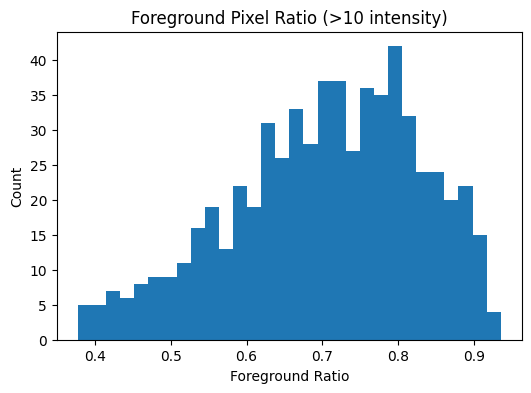

Foreground ratio range: 0.38 – 0.94


In [21]:
# ===== EDA 2.4: Foreground pixel ratio =====

foreground_ratios = []

for img_name in tqdm(df["image_name"], desc="Foreground analysis"):
    img = cv2.imread(os.path.join(IMAGE_DIR, img_name), 0)
    if img is not None:
        foreground = (img > 10).sum()
        ratio = foreground / img.size
        foreground_ratios.append(ratio)

plt.figure(figsize=(6,4))
plt.hist(foreground_ratios, bins=30)
plt.title("Foreground Pixel Ratio (>10 intensity)")
plt.xlabel("Foreground Ratio")
plt.ylabel("Count")
plt.show()

print(f"Foreground ratio range: {min(foreground_ratios):.2f} – {max(foreground_ratios):.2f}")


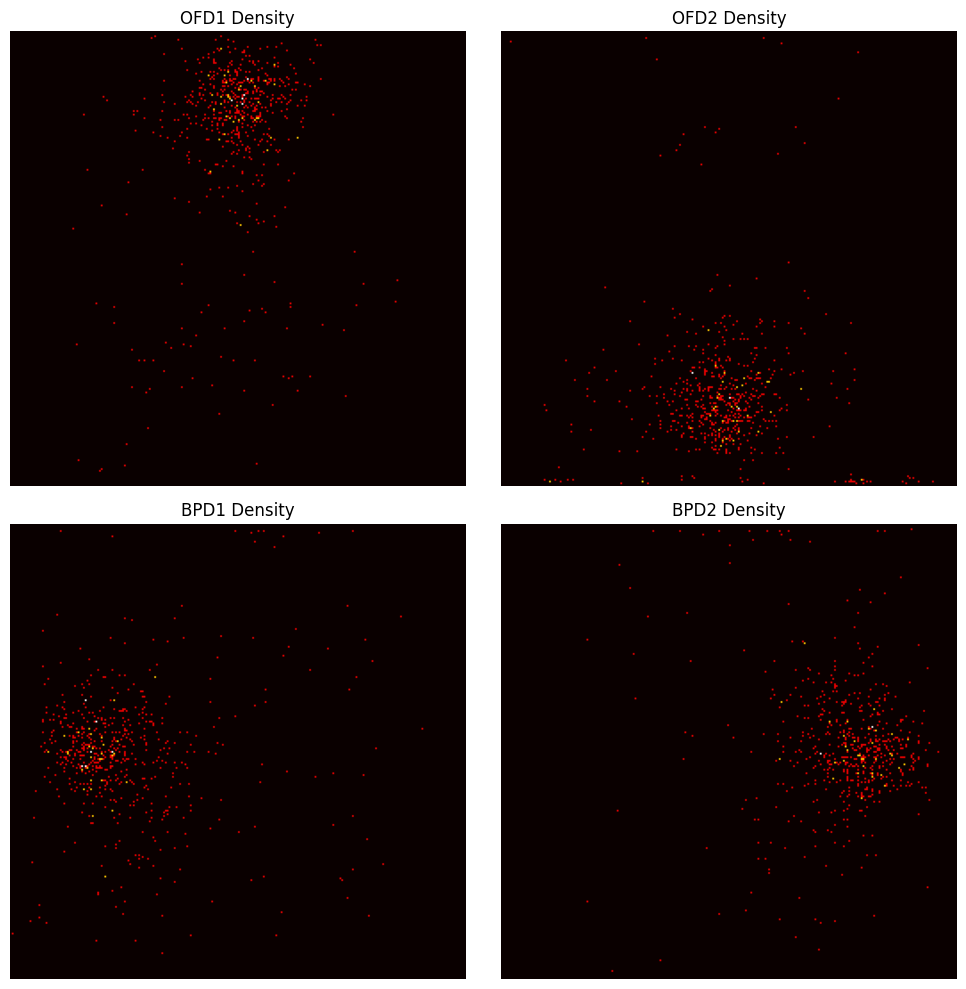

In [22]:
# ===== EDA 3.1: Landmark spatial density =====

import numpy as np
import cv2
import matplotlib.pyplot as plt

IMG_SIZE = 256

heatmaps = {
    "OFD1": np.zeros((IMG_SIZE, IMG_SIZE)),
    "OFD2": np.zeros((IMG_SIZE, IMG_SIZE)),
    "BPD1": np.zeros((IMG_SIZE, IMG_SIZE)),
    "BPD2": np.zeros((IMG_SIZE, IMG_SIZE)),
}

for row in df.itertuples():
    img = cv2.imread(os.path.join(IMAGE_DIR, row.image_name), 0)
    h, w = img.shape

    scale_x = IMG_SIZE / w
    scale_y = IMG_SIZE / h

    heatmaps["OFD1"][int(row.ofd_1_y * scale_y), int(row.ofd_1_x * scale_x)] += 1
    heatmaps["OFD2"][int(row.ofd_2_y * scale_y), int(row.ofd_2_x * scale_x)] += 1
    heatmaps["BPD1"][int(row.bpd_1_y * scale_y), int(row.bpd_1_x * scale_x)] += 1
    heatmaps["BPD2"][int(row.bpd_2_y * scale_y), int(row.bpd_2_x * scale_x)] += 1

plt.figure(figsize=(10,10))
for i, (k, hm) in enumerate(heatmaps.items()):
    plt.subplot(2,2,i+1)
    plt.imshow(hm, cmap="hot")
    plt.title(f"{k} Density")
    plt.axis("off")
plt.tight_layout()
plt.show()



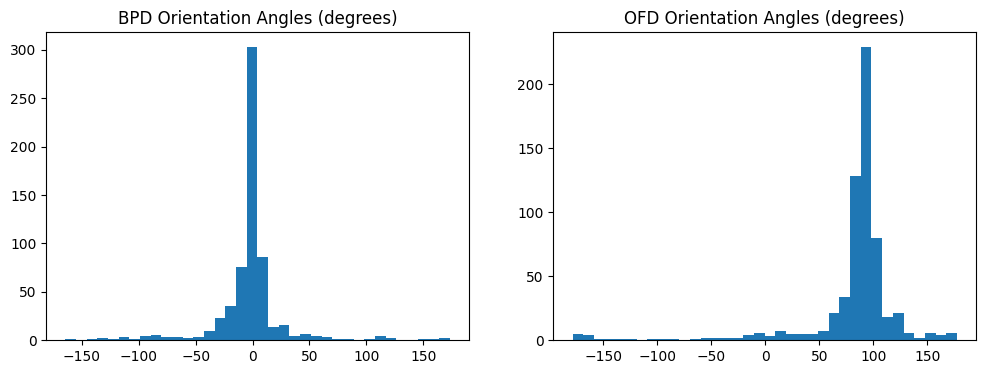

In [23]:
# ===== EDA 3.2: Orientation analysis =====

import math

def angle(p1, p2):
    return math.degrees(math.atan2(p2[1]-p1[1], p2[0]-p1[0]))

bpd_angles = []
ofd_angles = []

for row in df.itertuples():
    bpd_angles.append(angle(
        (row.bpd_1_x, row.bpd_1_y),
        (row.bpd_2_x, row.bpd_2_y)
    ))
    ofd_angles.append(angle(
        (row.ofd_1_x, row.ofd_1_y),
        (row.ofd_2_x, row.ofd_2_y)
    ))

plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.hist(bpd_angles, bins=36)
plt.title("BPD Orientation Angles (degrees)")

plt.subplot(1,2,2)
plt.hist(ofd_angles, bins=36)
plt.title("OFD Orientation Angles (degrees)")
plt.show()


In [24]:
# ===== EDA 3.3.1: Landmark anomaly detection =====

import numpy as np
import cv2
import pandas as pd

IMG_SIZE = 256

# Normalize landmarks to 256x256 reference
norm_landmarks = {
    "ofd1": [],
    "ofd2": [],
    "bpd1": [],
    "bpd2": []
}

image_shapes = {}

for row in df.itertuples():
    img = cv2.imread(os.path.join(IMAGE_DIR, row.image_name), 0)
    h, w = img.shape
    image_shapes[row.image_name] = (h, w)

    sx, sy = IMG_SIZE / w, IMG_SIZE / h

    norm_landmarks["ofd1"].append([row.ofd_1_x * sx, row.ofd_1_y * sy])
    norm_landmarks["ofd2"].append([row.ofd_2_x * sx, row.ofd_2_y * sy])
    norm_landmarks["bpd1"].append([row.bpd_1_x * sx, row.bpd_1_y * sy])
    norm_landmarks["bpd2"].append([row.bpd_2_x * sx, row.bpd_2_y * sy])

# Convert to numpy
for k in norm_landmarks:
    norm_landmarks[k] = np.array(norm_landmarks[k])

# Compute centroids and std
stats = {}
for k, pts in norm_landmarks.items():
    stats[k] = {
        "mean": pts.mean(axis=0),
        "std": pts.std(axis=0) + 1e-6  # numerical safety
    }


In [25]:
# ===== EDA 3.3.2: Compute anomaly scores =====

anomaly_scores = []

for i, row in enumerate(df.itertuples()):
    z_scores = []

    for key, idx in zip(
        ["ofd1", "ofd2", "bpd1", "bpd2"],
        [0, 1, 2, 3]
    ):
        pt = norm_landmarks[key][i]
        mean = stats[key]["mean"]
        std = stats[key]["std"]

        z = np.sqrt(((pt - mean) / std) @ ((pt - mean) / std))
        z_scores.append(z)

    anomaly_scores.append(max(z_scores))

df["anomaly_score"] = anomaly_scores

print("Anomaly score summary:")
print(df["anomaly_score"].describe())


Anomaly score summary:
count    622.000000
mean       1.749829
std        1.231171
min        0.327673
25%        0.905563
50%        1.221772
75%        2.319046
max        6.641310
Name: anomaly_score, dtype: float64


In [26]:
# ===== EDA 3.3.3: Select anomalous samples =====

threshold = 3.5
anomalies = df[df["anomaly_score"] > threshold]

print(f"Number of anomalous samples: {len(anomalies)}")
anomalies[["image_name", "anomaly_score"]].head()


Number of anomalous samples: 82


,image_name,anomaly_score
0,000_HC.png,4.185949
11,010_HC.png,5.123700
13,012_HC.png,3.960731
20,017_2HC.png,4.727488
23,019_2HC.png,3.536058


In [27]:
# ===== EDA 3.3.4: Visualize anomalous landmark samples =====

import matplotlib.pyplot as plt

def show_anomalies(anomaly_df, max_images=6):
    samples = anomaly_df.sort_values("anomaly_score", ascending=False).head(max_images)

    plt.figure(figsize=(15, 8))
    for i, row in enumerate(samples.itertuples()):
        img = cv2.imread(os.path.join(IMAGE_DIR, row.image_name), 0)
        h, w = img.shape

        plt.subplot(2, 3, i+1)
        plt.imshow(img, cmap="gray")

        # Plot landmarks
        plt.scatter(
            [row.ofd_1_x, row.ofd_2_x],
            [row.ofd_1_y, row.ofd_2_y],
            c="red", label="OFD"
        )
        plt.scatter(
            [row.bpd_1_x, row.bpd_2_x],
            [row.bpd_1_y, row.bpd_2_y],
            c="lime", label="BPD"
        )

        plt.title(f"{row.image_name}\nScore={row.anomaly_score:.2f}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()




In [28]:
# ===== Compute head center from biometry =====

def midpoint(p1, p2):
    return ((p1[0] + p2[0]) / 2, (p1[1] + p2[1]) / 2)

centers = []

for row in df.itertuples():
    bpd_mid = midpoint(
        (row.bpd_1_x, row.bpd_1_y),
        (row.bpd_2_x, row.bpd_2_y)
    )
    ofd_mid = midpoint(
        (row.ofd_1_x, row.ofd_1_y),
        (row.ofd_2_x, row.ofd_2_y)
    )

    # Average midpoint (robust to slight asymmetry)
    cx = (bpd_mid[0] + ofd_mid[0]) / 2
    cy = (bpd_mid[1] + ofd_mid[1]) / 2

    centers.append((cx, cy))

df["cx"], df["cy"] = zip(*centers)


In [29]:
# ===== Compute head scale (mean radius) =====

def euclidean(p1, p2):
    return np.sqrt((p1[0]-p2[0])**2 + (p1[1]-p2[1])**2)

scales = []

for row in df.itertuples():
    bpd = euclidean(
        (row.bpd_1_x, row.bpd_1_y),
        (row.bpd_2_x, row.bpd_2_y)
    )
    ofd = euclidean(
        (row.ofd_1_x, row.ofd_1_y),
        (row.ofd_2_x, row.ofd_2_y)
    )

    # Mean radius of ellipse
    scale = 0.5 * (bpd + ofd) / 2
    scales.append(scale)

df["head_scale"] = scales


In [30]:
# ===== Head-normalized landmark coordinates =====

norm_landmarks = {
    "ofd1": [],
    "ofd2": [],
    "bpd1": [],
    "bpd2": []
}

for row in df.itertuples():
    for key, (x, y) in {
        "ofd1": (row.ofd_1_x, row.ofd_1_y),
        "ofd2": (row.ofd_2_x, row.ofd_2_y),
        "bpd1": (row.bpd_1_x, row.bpd_1_y),
        "bpd2": (row.bpd_2_x, row.bpd_2_y),
    }.items():
        xn = (x - row.cx) / row.head_scale
        yn = (y - row.cy) / row.head_scale
        norm_landmarks[key].append((xn, yn))

for k in norm_landmarks:
    norm_landmarks[k] = np.array(norm_landmarks[k])


In [31]:
# ===== Compute landmark population statistics =====

stats = {}
for k, pts in norm_landmarks.items():
    stats[k] = {
        "mean": pts.mean(axis=0),
        "cov": np.cov(pts.T)  # full covariance
    }


In [32]:
# ===== Mahalanobis anomaly score =====

from numpy.linalg import inv

inv_cov = {k: inv(stats[k]["cov"] + 1e-6*np.eye(2)) for k in stats}

anomaly_scores = []

for i in range(len(df)):
    scores = []
    for k in norm_landmarks:
        diff = norm_landmarks[k][i] - stats[k]["mean"]
        score = np.sqrt(diff @ inv_cov[k] @ diff.T)
        scores.append(score)
    anomaly_scores.append(max(scores))

df["anomaly_score"] = anomaly_scores

df["anomaly_score"].describe()


count    622.000000
mean       1.302766
std        1.525412
min        0.265341
25%        0.397083
50%        0.557249
75%        1.600218
max       11.400361
Name: anomaly_score, dtype: float64

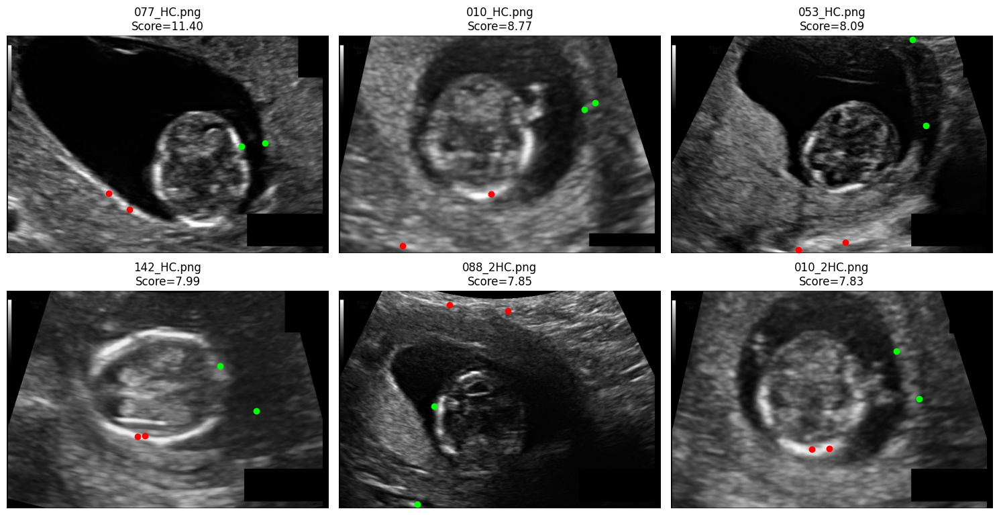

In [33]:
# ===== Visualize top anomalies =====

def visualize_anomalies(df, top_k=6):
    samples = df.sort_values("anomaly_score", ascending=False).head(top_k)

    plt.figure(figsize=(15, 8))
    for i, row in enumerate(samples.itertuples()):
        img = cv2.imread(os.path.join(IMAGE_DIR, row.image_name), 0)

        plt.subplot(2, 3, i+1)
        plt.imshow(img, cmap="gray")

        plt.scatter(
            [row.ofd_1_x, row.ofd_2_x],
            [row.ofd_1_y, row.ofd_2_y],
            c="red", label="OFD"
        )
        plt.scatter(
            [row.bpd_1_x, row.bpd_2_x],
            [row.bpd_1_y, row.bpd_2_y],
            c="lime", label="BPD"
        )

        plt.title(f"{row.image_name}\nScore={row.anomaly_score:.2f}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

visualize_anomalies(df)


In [34]:
import os
import cv2
import pandas as pd
import matplotlib.pyplot as plt

def show_image_with_landmarks(
    image_name,
    csv_path="/kaggle/input/taska-ultrasound/dataset_taskA/role_challenge_dataset_ground_truth.csv",
    image_dir="/kaggle/input/taska-ultrasound/dataset_taskA/images"
):
    """
    Display an ultrasound image with original OFD and BPD landmarks.
    
    Parameters:
    - image_name (str): Name of the image file
    - csv_path (str): Path to ground truth CSV
    - image_dir (str): Directory containing images
    """

    # Load CSV
    df = pd.read_csv(csv_path)

    # Find row for image
    row = df[df["image_name"] == image_name]
    if row.empty:
        raise ValueError(f"Image name '{image_name}' not found in CSV.")

    row = row.iloc[0]

    # Load image (no resizing)
    img_path = os.path.join(image_dir, image_name)
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

    if img is None:
        raise FileNotFoundError(f"Image not found or unreadable: {img_path}")

    # Plot
    plt.figure(figsize=(6, 6))
    plt.imshow(img, cmap="gray")

    # OFD landmarks
    plt.scatter(
        [row.ofd_1_x, row.ofd_2_x],
        [row.ofd_1_y, row.ofd_2_y],
        c="red", s=40, label="OFD"
    )
    plt.plot(
        [row.ofd_1_x, row.ofd_2_x],
        [row.ofd_1_y, row.ofd_2_y],
        "r-"
    )

    # BPD landmarks
    plt.scatter(
        [row.bpd_1_x, row.bpd_2_x],
        [row.bpd_1_y, row.bpd_2_y],
        c="lime", s=40, label="BPD"
    )
    plt.plot(
        [row.bpd_1_x, row.bpd_2_x],
        [row.bpd_1_y, row.bpd_2_y],
        "g-"
    )

    plt.title(image_name)
    plt.legend()
    plt.axis("off")
    plt.show()


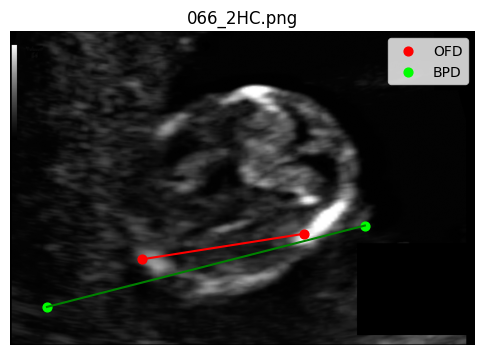

In [35]:
show_image_with_landmarks("066_2HC.png")


In [36]:
def get_top_anomalous_images(df, top_k=10):
    """
    Returns a DataFrame of top-K anomalous samples.
    """
    if "anomaly_score" not in df.columns:
        raise ValueError("anomaly_score column not found in DataFrame.")

    return df.sort_values("anomaly_score", ascending=False).head(top_k)


In [37]:
import matplotlib.pyplot as plt
import cv2
import os

def show_anomalous_images(
    df,
    image_dir=IMAGE_DIR,
    top_k=10,
    cols=5
):
    """
    Display top-K anomalous images with original landmarks.
    """
    samples = get_top_anomalous_images(df, top_k)

    rows = int(np.ceil(top_k / cols))
    plt.figure(figsize=(cols * 4, rows * 4))

    for i, row in enumerate(samples.itertuples()):
        img_path = os.path.join(image_dir, row.image_name)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

        if img is None:
            continue

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img, cmap="gray")

        # OFD
        plt.scatter(
            [row.ofd_1_x, row.ofd_2_x],
            [row.ofd_1_y, row.ofd_2_y],
            c="red", s=25
        )
        plt.plot(
            [row.ofd_1_x, row.ofd_2_x],
            [row.ofd_1_y, row.ofd_2_y],
            "r-"
        )

        # BPD
        plt.scatter(
            [row.bpd_1_x, row.bpd_2_x],
            [row.bpd_1_y, row.bpd_2_y],
            c="lime", s=25
        )
        plt.plot(
            [row.bpd_1_x, row.bpd_2_x],
            [row.bpd_1_y, row.bpd_2_y],
            "g-"
        )

        plt.title(f"{row.image_name}\nScore={row.anomaly_score:.2f}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()


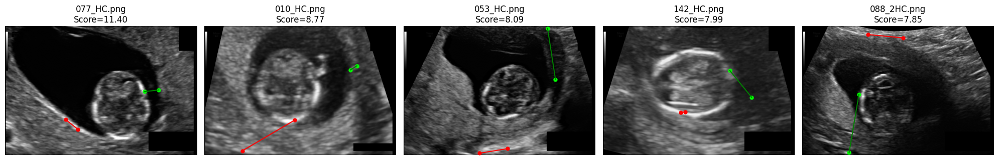

In [38]:
show_anomalous_images(df, top_k=5, cols=5)


In [39]:
df[df["anomaly_score"]<1.15]

,image_name,ofd_1_x,ofd_1_y,ofd_2_x,ofd_2_y,bpd_1_x,bpd_1_y,bpd_2_x,bpd_2_y,exists,anomaly_score,cx,cy,head_scale
17,014_HC.png,453,131,421,530,314,323,676,194,True,0.919469,466.00,294.50,196.144803
19,016_HC.png,418,239,336,528,181,436,595,305,True,0.684553,382.50,377.00,183.659890
35,027_HC.png,536,11,576,469,274,341,732,261,True,0.755274,529.50,270.50,231.169453
37,029_HC.png,315,145,331,472,162,232,574,300,True,0.684018,345.50,287.25,186.241287
52,042_HC.png,363,74,442,425,196,325,580,181,True,0.820740,395.25,251.25,192.473167
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
617,497_HC.png,407,77,432,411,181,270,634,281,True,0.395543,413.50,259.75,197.016964
618,498_HC.png,445,75,412,458,129,243,687,275,True,0.526257,418.25,262.75,235.833963
619,499_2HC.png,432,105,411,470,194,284,647,296,True,0.320592,421.00,288.75,204.690631
620,499_HC.png,356,119,357,484,138,347,608,272,True,0.426731,364.75,305.50,210.236949


In [40]:
# =========================
# DATASET LOCKDOWN
# =========================

CORE_THRESHOLD = 1.15
EXTREME_THRESHOLD = 2.3 

df = df.copy()  # protect original reference

df["data_quality"] = "core"
df.loc[df["anomaly_score"] >= CORE_THRESHOLD, "data_quality"] = "borderline"
df.loc[df["anomaly_score"] >= EXTREME_THRESHOLD, "data_quality"] = "exclude"


In [41]:
df["data_quality"].value_counts()


data_quality
core          427
exclude       114
borderline     81
Name: count, dtype: int64

In [42]:
CORE_IDX = df[df["data_quality"] == "core"].index.to_numpy()
BORDERLINE_IDX = df[df["data_quality"] == "borderline"].index.to_numpy()
EXCLUDE_IDX = df[df["data_quality"] == "exclude"].index.to_numpy()

print(f"Core: {len(CORE_IDX)}")
print(f"Borderline: {len(BORDERLINE_IDX)}")
print(f"Excluded: {len(EXCLUDE_IDX)}")


Core: 427
Borderline: 81
Excluded: 114


In [43]:
def get_core_dataset(df):
    return df.loc[CORE_IDX].reset_index(drop=True)

def get_core_plus_borderline_dataset(df):
    return df.loc[np.concatenate([CORE_IDX, BORDERLINE_IDX])].reset_index(drop=True)

def get_excluded_dataset(df):
    return df.loc[EXCLUDE_IDX].reset_index(drop=True)


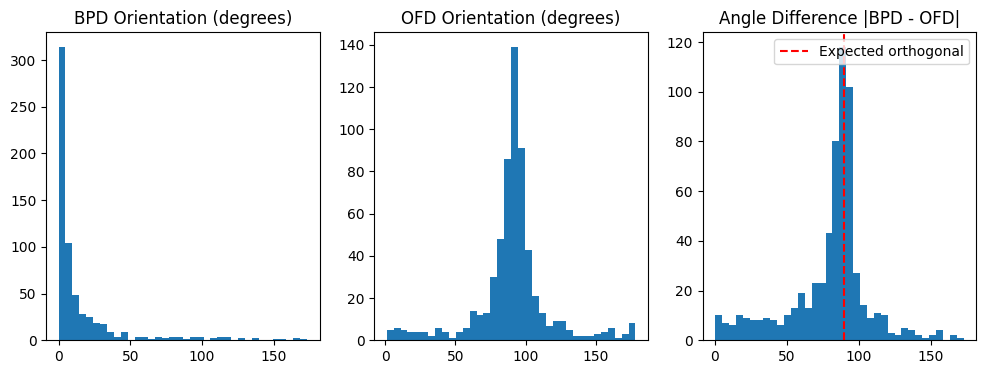

In [44]:
import numpy as np
import matplotlib.pyplot as plt

def compute_angle(p1, p2):
    """Return angle in degrees of the line from p1 to p2 relative to x-axis."""
    return np.degrees(np.arctan2(p2[1]-p1[1], p2[0]-p1[0]))

bpd_angles = []
ofd_angles = []
angle_diff = []

for row in df.itertuples():
    bpd_angle = compute_angle((row.bpd_1_x, row.bpd_1_y), (row.bpd_2_x, row.bpd_2_y))
    ofd_angle = compute_angle((row.ofd_1_x, row.ofd_1_y), (row.ofd_2_x, row.ofd_2_y))
    
    # Normalize angles to [0,180]
    bpd_angle = abs(bpd_angle) % 180
    ofd_angle = abs(ofd_angle) % 180
    
    bpd_angles.append(bpd_angle)
    ofd_angles.append(ofd_angle)
    angle_diff.append(abs(bpd_angle - ofd_angle))

# Visualize
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
plt.hist(bpd_angles, bins=36)
plt.title("BPD Orientation (degrees)")

plt.subplot(1,3,2)
plt.hist(ofd_angles, bins=36)
plt.title("OFD Orientation (degrees)")

plt.subplot(1,3,3)
plt.hist(angle_diff, bins=36)
plt.title("Angle Difference |BPD - OFD|")
plt.axvline(90, color='red', linestyle='--', label='Expected orthogonal')
plt.legend()
plt.show()


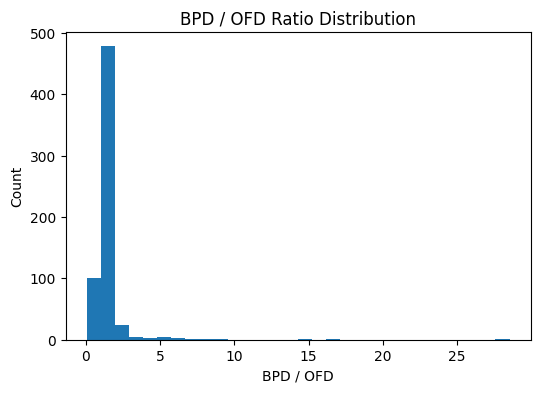

Ratio range: 0.06 – 28.54, mean: 1.46


In [45]:
def euclidean(p1, p2):
    return np.sqrt((p1[0]-p2[0])**2 + (p1[1]-p2[1])**2)

ratios = []

for row in df.itertuples():
    bpd = euclidean((row.bpd_1_x, row.bpd_1_y), (row.bpd_2_x, row.bpd_2_y))
    ofd = euclidean((row.ofd_1_x, row.ofd_1_y), (row.ofd_2_x, row.ofd_2_y))
    ratio = bpd / ofd
    ratios.append(ratio)

plt.figure(figsize=(6,4))
plt.hist(ratios, bins=30)
plt.title("BPD / OFD Ratio Distribution")
plt.xlabel("BPD / OFD")
plt.ylabel("Count")
plt.show()

print(f"Ratio range: {min(ratios):.2f} – {max(ratios):.2f}, mean: {np.mean(ratios):.2f}")


In [46]:
core_df = get_core_dataset(df)
core_ratios = [
    euclidean((row.bpd_1_x, row.bpd_1_y), (row.bpd_2_x, row.bpd_2_y)) /
    euclidean((row.ofd_1_x, row.ofd_1_y), (row.ofd_2_x, row.ofd_2_y))
    for row in core_df.itertuples()
]
print(f"Core dataset BPD/OFD ratio range: {min(core_ratios):.2f} – {max(core_ratios):.2f}, mean: {np.mean(core_ratios):.2f}")


Core dataset BPD/OFD ratio range: 0.86 – 2.73, mean: 1.33


In [48]:
import torch
from torch.utils.data import Dataset
import cv2
import os
import numpy as np

class UltrasoundCoordinateDataset(Dataset):
    """
    Dataset for Direct Coordinate Regression of fetal landmarks.
    Returns:
        image: Tensor (1, H, W)
        coords: Tensor (8,) -> [ofd1_x, ofd1_y, ofd2_x, ofd2_y, bpd1_x, bpd1_y, bpd2_x, bpd2_y] normalized to [0,1]
    """
    def __init__(self, df, image_dir, img_size=256, transform=None):
        self.df = df.reset_index(drop=True)
        self.image_dir = image_dir
        self.img_size = img_size
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = os.path.join(self.image_dir, row.image_name)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            raise FileNotFoundError(f"Image not found: {img_path}")

        # Resize
        h, w = img.shape
        img_resized = cv2.resize(img, (self.img_size, self.img_size))
        img_resized = img_resized.astype(np.float32) / 255.0
        img_resized = (img_resized - img_resized.mean()) / (img_resized.std() + 1e-6)
        img_tensor = torch.from_numpy(img_resized).unsqueeze(0)  # 1xHxW

        # Normalize coordinates to [0,1] relative to original image size
        coords = np.array([
            row.ofd_1_x / w, row.ofd_1_y / h,
            row.ofd_2_x / w, row.ofd_2_y / h,
            row.bpd_1_x / w, row.bpd_1_y / h,
            row.bpd_2_x / w, row.bpd_2_y / h
        ], dtype=np.float32)
        coords_tensor = torch.from_numpy(coords)

        # Optional transforms (augmentation)
        if self.transform:
            img_tensor, coords_tensor = self.transform(img_tensor, coords_tensor)

        return img_tensor, coords_tensor


In [49]:
CORE_IDX = df[df["data_quality"]=="core"].index
core_df = df.loc[CORE_IDX]

dataset = UltrasoundCoordinateDataset(core_df, image_dir=IMAGE_DIR, img_size=256)
img, coords = dataset[0]
print(img.shape, coords.shape)  # torch.Size([1,256,256]), torch.Size([8])


NameError: name 'UltrasoundCoordinateDataset' is not defined

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SimpleCoordCNN(nn.Module):
    """
    Simple CNN for direct coordinate regression of fetal landmarks.
    Input: 1x256x256 grayscale image
    Output: 8 coordinates normalized to [0,1]
    """
    def __init__(self):
        super(SimpleCoordCNN, self).__init__()
        
        self.features = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, stride=1, padding=1),  # 256x256
            nn.ReLU(),
            nn.MaxPool2d(2),  # 128x128

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),  # 64x64

            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),  # 32x32

            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),  # 16x16
        )

        self.fc = nn.Sequential(
            nn.Linear(256*16*16, 512),
            nn.ReLU(),
            nn.Linear(512, 8)  # 8 coordinates (x,y for 4 landmarks)
        )

    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), -1)
        coords = self.fc(x)
        coords = torch.sigmoid(coords)  # ensures output in [0,1]
        return coords


In [ ]:
model = SimpleCoordCNN()
sample_img, sample_coords = dataset[0]
sample_img = sample_img.unsqueeze(0)  # batch dimension
pred_coords = model(sample_img)
print(pred_coords.shape)  # torch.Size([1,8])


In [ ]:
from torch.utils.data import DataLoader, random_split
import torch.optim as optim

# =========================
# Hyperparameters
# =========================
IMG_SIZE = 256
BATCH_SIZE = 8
LR = 1e-3
EPOCHS = 80
VALID_SPLIT = 0.15
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# =========================
# Dataset and split
# =========================
core_df = get_core_dataset(df)
val_size = int(len(core_df) * VALID_SPLIT)
train_size = len(core_df) - val_size
train_df, val_df = random_split(core_df, [train_size, val_size])

train_dataset = UltrasoundCoordinateDataset(train_df.dataset, IMAGE_DIR, img_size=IMG_SIZE)
val_dataset = UltrasoundCoordinateDataset(val_df.dataset, IMAGE_DIR, img_size=IMG_SIZE)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

# =========================
# Model, Loss, Optimizer
# =========================
model = SimpleCoordCNN().to(DEVICE)
criterion = nn.SmoothL1Loss()  # Huber loss
optimizer = optim.AdamW(model.parameters(), lr=LR)

# Optional: quality-aware weighting function
def get_loss_weight(indices, df_subset):
    """Returns per-sample loss weight based on data_quality"""
    weights = []
    for idx in indices:
        row = df_subset.iloc[idx]
        if row.data_quality == "core":
            weights.append(1.0)
        else:  # borderline
            weights.append(0.5)
    return torch.tensor(weights, dtype=torch.float32, device=DEVICE)


import matplotlib.pyplot as plt
from copy import deepcopy

# =========================
# Early Stopping Parameters
# =========================
PATIENCE = 10  # stop if no improvement for 10 epochs
best_val_loss = float('inf')
patience_counter = 0
best_model_wts = deepcopy(model.state_dict())

# =========================
# Track loss curves
# =========================
train_losses = []
val_losses = []

for epoch in range(EPOCHS):
    model.train()
    train_loss = 0.0
    for imgs, coords in train_loader:
        imgs = imgs.to(DEVICE)
        coords = coords.to(DEVICE)

        optimizer.zero_grad()
        preds = model(imgs)
        loss = criterion(preds, coords)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * imgs.size(0)

    train_loss /= len(train_loader.dataset)
    train_losses.append(train_loss)

    # Validation
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for imgs, coords in val_loader:
            imgs = imgs.to(DEVICE)
            coords = coords.to(DEVICE)
            preds = model(imgs)
            loss = criterion(preds, coords)
            val_loss += loss.item() * imgs.size(0)
    val_loss /= len(val_loader.dataset)
    val_losses.append(val_loss)

    print(f"Epoch [{epoch+1}/{EPOCHS}]  Train Loss: {train_loss:.6f}  Val Loss: {val_loss:.6f}")

    # Early stopping check
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_wts = deepcopy(model.state_dict())
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= PATIENCE:
            print(f"Early stopping at epoch {epoch+1}")
            break

# Load best model weights
model.load_state_dict(best_model_wts)

# =========================
# Plot training curves
# =========================
plt.figure(figsize=(8,5))
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Curves')
plt.legend()
plt.show()


In [ ]:
def evaluate_model(model, dataset, device="cuda"):
    """
    Evaluate direct coordinate regression model on a dataset.
    Returns NME per image and average NME.
    """
    model.eval()
    loader = DataLoader(dataset, batch_size=1, shuffle=False)

    nme_list = []
    results = []

    with torch.no_grad():
        for idx, (img, coords) in enumerate(loader):
            img = img.to(device)
            coords = coords.to(device)
            pred = model(img).cpu().numpy()[0]  # normalized [0,1]

            # Rescale to original image size
            row = dataset.df.iloc[idx]
            h, w = cv2.imread(os.path.join(dataset.image_dir, row.image_name), cv2.IMREAD_GRAYSCALE).shape
            pred_coords = pred.copy()
            pred_coords[::2] *= w  # x
            pred_coords[1::2] *= h  # y

            gt_coords = np.array([
                row.ofd_1_x, row.ofd_1_y,
                row.ofd_2_x, row.ofd_2_y,
                row.bpd_1_x, row.bpd_1_y,
                row.bpd_2_x, row.bpd_2_y
            ])

            # Reference length: OFD distance
            ofd_len = np.linalg.norm(np.array([row.ofd_1_x, row.ofd_1_y]) - np.array([row.ofd_2_x, row.ofd_2_y]))

            # Compute NME
            nme = 0
            for i in range(4):
                pred_pt = pred_coords[2*i:2*i+2]
                gt_pt = gt_coords[2*i:2*i+2]
                nme += np.linalg.norm(pred_pt - gt_pt) / ofd_len
            nme /= 4.0

            nme_list.append(nme)
            results.append({
                "image_name": row.image_name,
                "nme": nme
            })

    avg_nme = np.mean(nme_list)
    print(f"Average NME: {avg_nme:.4f}")
    return results, avg_nme


In [ ]:
results, avg_nme = evaluate_model(model, val_dataset, device=DEVICE)


In [ ]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
from torch.utils.data import DataLoader

def visualize_predictions(model, dataset, image_dir, device="cuda", num_images=5):
    """
    Visualize predicted vs ground truth landmarks for a few images.
    Args:
        model: trained PyTorch model
        dataset: PyTorch dataset
        image_dir: path to folder containing images
        device: 'cuda' or 'cpu'
        num_images: number of random images to show
    """
    model.eval()
    loader = DataLoader(dataset, batch_size=1, shuffle=True)
    count = 0

    with torch.no_grad():
        for img_tensor, coords_tensor in loader:
            img_np = img_tensor.squeeze().cpu().numpy()
            img_disp = (img_np - img_np.min()) / (img_np.max() - img_np.min())

            # Prediction
            pred = model(img_tensor.to(device)).cpu().numpy()[0]

            # Original image shape
            row = dataset.df.iloc[count]
            orig_img_path = os.path.join(image_dir, row.image_name)
            orig_img = cv2.imread(orig_img_path, cv2.IMREAD_GRAYSCALE)
            h, w = orig_img.shape

            # Rescale predicted coordinates to original size
            pred_coords = pred.copy()
            pred_coords[::2] *= w
            pred_coords[1::2] *= h

            # Ground truth coordinates
            gt_coords = np.array([
                row.ofd_1_x, row.ofd_1_y,
                row.ofd_2_x, row.ofd_2_y,
                row.bpd_1_x, row.bpd_1_y,
                row.bpd_2_x, row.bpd_2_y
            ])
            print(row.image_name)
            # Display
            plt.figure(figsize=(5,5))
            plt.imshow(orig_img, cmap="gray")
            plt.title(f"Image: {row.image_name}")
            # Ground truth
            plt.scatter([gt_coords[0], gt_coords[2]], [gt_coords[1], gt_coords[3]], c="red", label="OFD GT")
            plt.scatter([gt_coords[4], gt_coords[6]], [gt_coords[5], gt_coords[7]], c="lime", label="BPD GT")
            # Predicted
            plt.scatter(pred_coords[0:8:2], pred_coords[1:8:2], c="cyan", marker="x", label="Pred")

            plt.legend()
            plt.axis("off")
            plt.show()

            count += 1
            if count >= num_images:
                break


In [ ]:
visualize_predictions(
    model=model, 
    dataset=val_dataset, 
    image_dir=IMAGE_DIR, 
    device=DEVICE, 
    num_images=5
)


In [ ]:
show_image_with_landmarks("027_HC.png")


In [69]:
import random
import math
import numpy as np
import cv2

def sample_affine_params(
    max_rotation=3,
    max_translation=0.05,
    scale_range=(0.9, 1.1),
    do_flip=True
):
    angle = random.uniform(-max_rotation, max_rotation)
    scale = random.uniform(scale_range[0], scale_range[1])

    tx = random.uniform(-max_translation, max_translation)
    ty = random.uniform(-max_translation, max_translation)

    flip = do_flip and random.random() < 0.5

    return angle, scale, tx, ty, flip


def apply_affine(img, points, angle, scale, tx, ty, flip):
    h, w = img.shape

    # Center
    cx, cy = w / 2, h / 2

    # Rotation + scale
    M = cv2.getRotationMatrix2D((cx, cy), angle, scale)

    # Translation
    M[0, 2] += tx * w
    M[1, 2] += ty * h

    # Apply to image
    img = cv2.warpAffine(
        img,
        M,
        (w, h),
        flags=cv2.INTER_LINEAR,
        borderMode=cv2.BORDER_REFLECT_101
    )

    # Apply to points
    pts = np.hstack([points, np.ones((points.shape[0], 1))])
    pts = (M @ pts.T).T

    # Optional horizontal flip
    if flip:
        img = np.fliplr(img)
        pts[:, 0] = w - pts[:, 0]

    return img, pts


In [93]:
import torch
from torch.utils.data import Dataset
import numpy as np
import cv2
import os
class UltrasoundHeatmapDataset(Dataset):
    def __init__(
        self,
        df,
        image_dir,
        img_size=256,
        sigma=3,
        augment=False
    ):
        self.df = df.reset_index(drop=True)
        self.image_dir = image_dir
        self.img_size = img_size
        self.sigma = sigma
        self.augment = augment

    def _gaussian(self, x, y, size):
        xx, yy = np.meshgrid(np.arange(size), np.arange(size))
        return np.exp(-((xx - x) ** 2 + (yy - y) ** 2) / (2 * self.sigma ** 2))

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = os.path.join(self.image_dir, row.image_name)

        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        h, w = img.shape

        # Original landmark points
        points = np.array([
    [row.bpd_1_x, row.bpd_1_y],  # horizontal → BPD
    [row.bpd_2_x, row.bpd_2_y],
    [row.ofd_1_x, row.ofd_1_y],  # vertical → OFD
    [row.ofd_2_x, row.ofd_2_y],
], dtype=np.float32)

        # ---------- AUGMENTATION ----------
        if self.augment:
            angle, scale, tx, ty, flip = sample_affine_params()
            img, points = apply_affine(
                img, points, angle, scale, tx, ty, flip
            )

        # ---------- RESIZE ----------
        img = cv2.resize(img, (self.img_size, self.img_size))

        sx = self.img_size / w
        sy = self.img_size / h
        points[:, 0] *= sx
        points[:, 1] *= sy

        # ---------- HEATMAPS ----------
        heatmaps = []
        for x, y in points:
            heatmaps.append(
                self._gaussian(int(x), int(y), self.img_size)
            )
        heatmaps = torch.from_numpy(np.stack(heatmaps)).float()

        # ---------- NORMALIZE ----------
        img = img.astype(np.float32) / 255.0
        img = (img - img.mean()) / (img.std() + 1e-6)
        img = torch.from_numpy(img).unsqueeze(0)

        return img, heatmaps, row.image_name


In [94]:
import torch.nn as nn
import torch.nn.functional as F

class ConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.block(x)

class HeatmapUNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.enc1 = ConvBlock(1, 32)
        self.enc2 = ConvBlock(32, 64)
        self.enc3 = ConvBlock(64, 128)

        self.pool = nn.MaxPool2d(2)

        self.bottleneck = ConvBlock(128, 256)

        self.up3 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec3 = ConvBlock(256, 128)

        self.up2 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec2 = ConvBlock(128, 64)

        self.up1 = nn.ConvTranspose2d(64, 32, 2, stride=2)
        self.dec1 = ConvBlock(64, 32)

        self.out = nn.Conv2d(32, 4, 1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))

        b = self.bottleneck(self.pool(e3))

        d3 = self.dec3(torch.cat([self.up3(b), e3], dim=1))
        d2 = self.dec2(torch.cat([self.up2(d3), e2], dim=1))
        d1 = self.dec1(torch.cat([self.up1(d2), e1], dim=1))

        return self.out(d1)


In [95]:
def heatmaps_to_coords(heatmaps):
    """
    heatmaps: (B, 4, H, W)
    returns: (B, 4, 2)
    """
    B, C, H, W = heatmaps.shape
    coords = []
    for b in range(B):
        pts = []
        for c in range(C):
            idx = torch.argmax(heatmaps[b, c])
            y = idx // W
            x = idx % W
            pts.append([x.item(), y.item()])
        coords.append(pts)
    return torch.tensor(coords)


In [108]:
import torch
DEVICE='cuda'
LANDMARK_WEIGHTS = torch.tensor(
    [3, 3, 1.0, 1.0],  # OFD-1, OFD-2, BPD-1, BPD-2
    device=DEVICE
)


In [109]:
class WeightedHeatmapMSELoss(torch.nn.Module):
    def __init__(self, weights):
        super().__init__()
        self.register_buffer("weights", weights)

    def forward(self, pred, target):
        # pred, target: (B, 4, H, W)
        loss = (pred - target) ** 2
        loss = loss.mean(dim=(2, 3))        # (B, 4)
        loss = loss * self.weights          # channel weighting
        return loss.mean()


In [110]:
def soft_argmax_2d(heatmaps, beta=100.0):
    """
    heatmaps: (B, C, H, W)
    returns:  (B, C, 2) in heatmap coordinates
    """
    B, C, H, W = heatmaps.shape

    heatmaps = heatmaps.view(B, C, -1)
    heatmaps = torch.softmax(heatmaps * beta, dim=-1)

    xs = torch.linspace(0, W - 1, W, device=heatmaps.device)
    ys = torch.linspace(0, H - 1, H, device=heatmaps.device)
    yy, xx = torch.meshgrid(ys, xs, indexing="ij")

    coords = torch.stack([xx.reshape(-1), yy.reshape(-1)], dim=-1)
    coords = coords.unsqueeze(0).unsqueeze(0)  # (1,1,HW,2)

    exp_coords = (heatmaps.unsqueeze(-1) * coords).sum(dim=2)
    return exp_coords


Epoch 1 | Train 0.076128 | Val 0.019306
Epoch 2 | Train 0.011292 | Val 0.007950
Epoch 3 | Train 0.005022 | Val 0.004519
Epoch 4 | Train 0.003407 | Val 0.003122
Epoch 5 | Train 0.002652 | Val 0.002490
Epoch 6 | Train 0.002235 | Val 0.002104
Epoch 7 | Train 0.001937 | Val 0.001879
Epoch 8 | Train 0.001746 | Val 0.001667
Epoch 9 | Train 0.001608 | Val 0.001555
Epoch 10 | Train 0.001503 | Val 0.001498
Epoch 11 | Train 0.001430 | Val 0.001355
Epoch 12 | Train 0.001345 | Val 0.001308
Epoch 13 | Train 0.001295 | Val 0.001265
Epoch 14 | Train 0.001253 | Val 0.001225
Epoch 15 | Train 0.001209 | Val 0.001180
Epoch 16 | Train 0.001179 | Val 0.001156
Epoch 17 | Train 0.001174 | Val 0.001124
Epoch 18 | Train 0.001139 | Val 0.001114
Epoch 19 | Train 0.001111 | Val 0.001083
Epoch 20 | Train 0.001090 | Val 0.001094
Epoch 21 | Train 0.001084 | Val 0.001046
Epoch 22 | Train 0.001072 | Val 0.001063
Epoch 23 | Train 0.001055 | Val 0.001025
Epoch 24 | Train 0.001032 | Val 0.001004
Epoch 25 | Train 0.001017

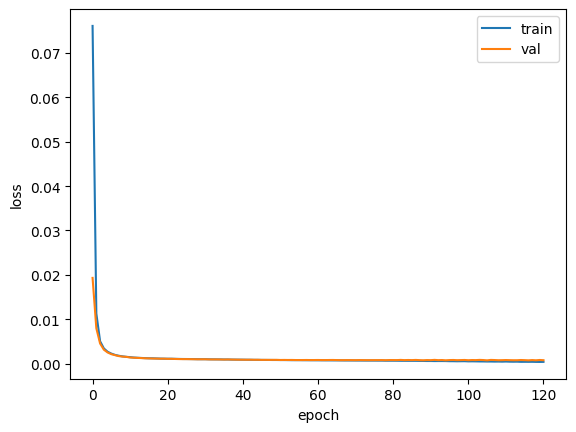

In [111]:
import torch.optim as optim
from copy import deepcopy
import matplotlib.pyplot as plt

from torch.utils.data import random_split

IMG_SIZE = 256
BATCH_SIZE = 8
LR = 1e-3
EPOCHS = 200
VALID_SPLIT = 0.15
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
core_df = get_core_dataset(df)

val_size = int(len(core_df) * VALID_SPLIT)
train_size = len(core_df) - val_size

train_idx, val_idx = random_split(
    range(len(core_df)),
    [train_size, val_size]
)

train_df = core_df.iloc[list(train_idx)].reset_index(drop=True)
val_df = core_df.iloc[list(val_idx)].reset_index(drop=True)

train_dataset = UltrasoundHeatmapDataset(
    train_df,
    IMAGE_DIR,
    img_size=IMG_SIZE,
    augment=True
)

val_dataset = UltrasoundHeatmapDataset(
    val_df,
    IMAGE_DIR,
    img_size=IMG_SIZE,
    augment=False
)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)


model = HeatmapUNet().to(DEVICE)
criterion = WeightedHeatmapMSELoss(LANDMARK_WEIGHTS)
optimizer = optim.AdamW(model.parameters(), lr=1e-4)

PATIENCE = 15
best_val = float("inf")
counter = 0
best_weights = deepcopy(model.state_dict())

train_losses, val_losses = [], []

for epoch in range(EPOCHS):
    model.train()
    train_loss = 0

    for imgs, heatmaps, _ in train_loader:
        imgs = imgs.to(DEVICE)
        heatmaps = heatmaps.to(DEVICE)

        optimizer.zero_grad()
        preds = model(imgs)
        loss = criterion(preds, heatmaps)
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * imgs.size(0)

    train_loss /= len(train_loader.dataset)
    train_losses.append(train_loss)

    model.eval()
    val_loss = 0
    with torch.no_grad():
        for imgs, heatmaps, _ in val_loader:
            imgs = imgs.to(DEVICE)
            heatmaps = heatmaps.to(DEVICE)
            preds = model(imgs)
            val_loss += criterion(preds, heatmaps).item() * imgs.size(0)

    val_loss /= len(val_loader.dataset)
    val_losses.append(val_loss)

    print(f"Epoch {epoch+1} | Train {train_loss:.6f} | Val {val_loss:.6f}")

    if val_loss < best_val:
        best_val = val_loss
        best_weights = deepcopy(model.state_dict())
        counter = 0
    else:
        counter += 1
        if counter >= PATIENCE:
            print("Early stopping")
            break

model.load_state_dict(best_weights)

plt.figure()
plt.plot(train_losses, label="train")
plt.plot(val_losses, label="val")
plt.legend()
plt.xlabel("epoch")
plt.ylabel("loss")
plt.show()


In [112]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
from torch.utils.data import DataLoader

def visualize_heatmap_predictions(
    model,
    dataset,
    image_dir,
    device,
    num_images=2
):
    model.eval()
    loader = DataLoader(dataset, batch_size=1, shuffle=True)

    labels = ["BPD-1", "BPD-2", "OFD-1", "OFD-2"]

    colors = ["red", "red", "lime", "lime"]

    shown = 0
    with torch.no_grad():
        for img, gt_heatmaps, name in loader:
            img = img.to(device)
            gt_heatmaps = gt_heatmaps.cpu().numpy()[0]
            pred_heatmaps = model(img).cpu().numpy()[0]

            # Coordinates (float!)
            gt_coords = soft_argmax_2d(
    torch.tensor(gt_heatmaps).unsqueeze(0)
)[0].cpu().numpy()

            pred_coords = soft_argmax_2d(
    torch.tensor(pred_heatmaps).unsqueeze(0)
)[0].cpu().numpy()

            # Load original image
            orig = cv2.imread(os.path.join(image_dir, name[0]), cv2.IMREAD_GRAYSCALE)
            h, w = orig.shape
            sx = w / dataset.img_size
            sy = h / dataset.img_size

            gt_coords[:, 0] *= sx
            gt_coords[:, 1] *= sy
            pred_coords[:, 0] *= sx
            pred_coords[:, 1] *= sy

            fig, axes = plt.subplots(3, 4, figsize=(20, 12))
            fig.suptitle(f"File: {name[0]}", fontsize=16)

            # -------- Row 1: Geometry --------
            for col, (coords, title) in enumerate([
                (gt_coords, "GT BPD / OFD"),
                (pred_coords, "Predicted BPD / OFD"),
            ]):
                axes[0, col].imshow(orig, cmap="gray")
                # OFD line
                axes[0, col].plot(
                    coords[0:2, 0], coords[0:2, 1],
                    "r-", linewidth=2, label="OFD"
                )
                # BPD line
                axes[0, col].plot(
                    coords[2:4, 0], coords[2:4, 1],
                    "g-", linewidth=2, label="BPD"
                )
                axes[0, col].set_title(title)
                axes[0, col].legend()
                axes[0, col].axis("off")

            # Overlay
            axes[0, 2].imshow(orig, cmap="gray")
            axes[0, 2].plot(gt_coords[0:2, 0], gt_coords[0:2, 1], "r-", linewidth=2)
            axes[0, 2].plot(gt_coords[2:4, 0], gt_coords[2:4, 1], "g-", linewidth=2)
            axes[0, 2].plot(pred_coords[0:2, 0], pred_coords[0:2, 1], "r--", linewidth=2)
            axes[0, 2].plot(pred_coords[2:4, 0], pred_coords[2:4, 1], "g--", linewidth=2)
            axes[0, 2].set_title("GT (solid) vs Pred (dashed)")
            axes[0, 2].axis("off")

            axes[0, 3].axis("off")

            # -------- Row 2: GT heatmaps --------
            for i in range(4):
                axes[1, i].imshow(gt_heatmaps[i], cmap="hot")
                axes[1, i].set_title(f"GT {labels[i]}")
                axes[1, i].axis("off")

            # -------- Row 3: Pred heatmaps --------
            for i in range(4):
                axes[2, i].imshow(pred_heatmaps[i], cmap="hot")
                axes[2, i].set_title(f"Pred {labels[i]}")
                axes[2, i].axis("off")

            plt.tight_layout()
            plt.show()

            shown += 1
            if shown >= num_images:
                break


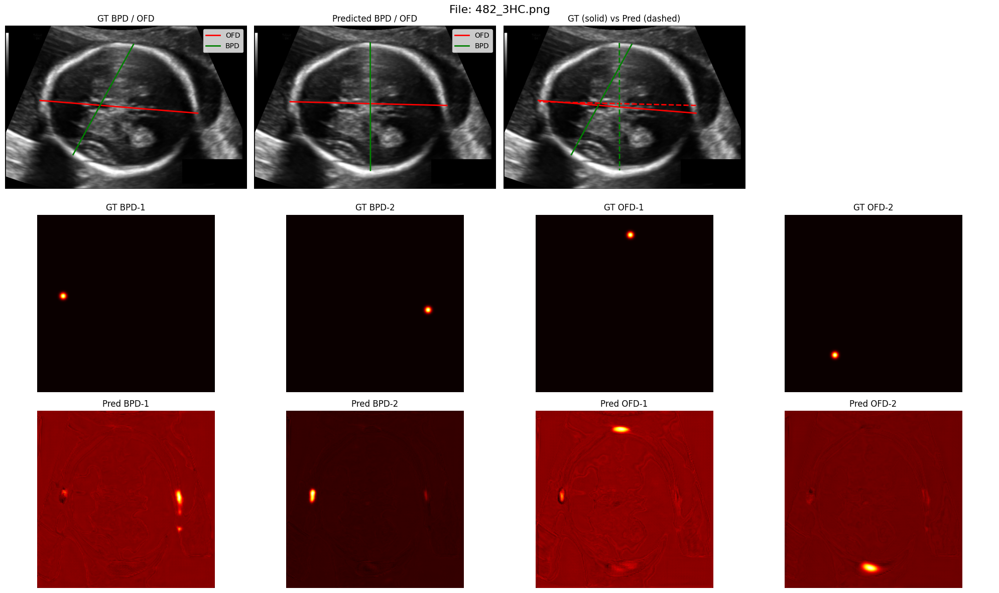

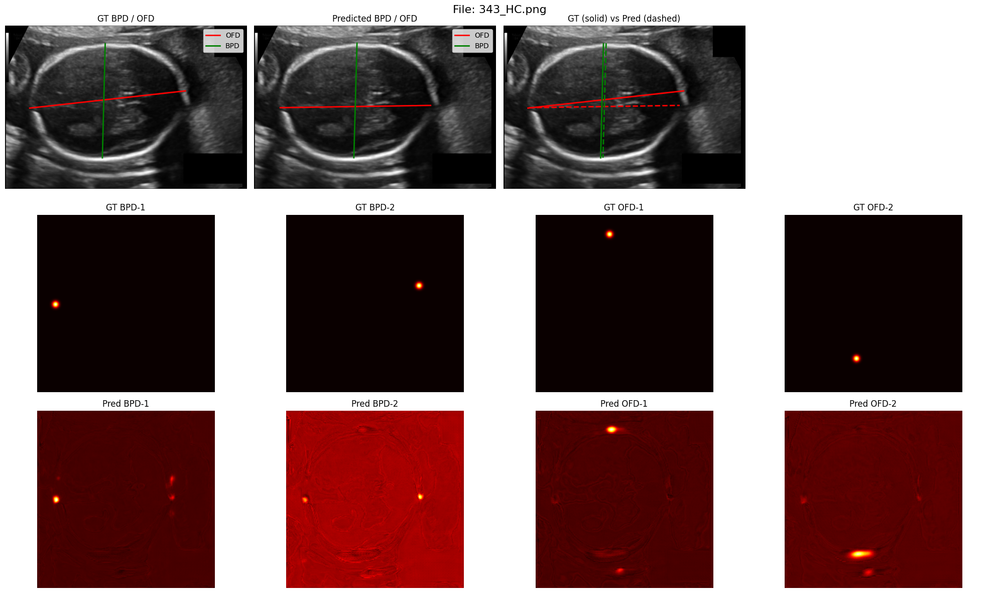

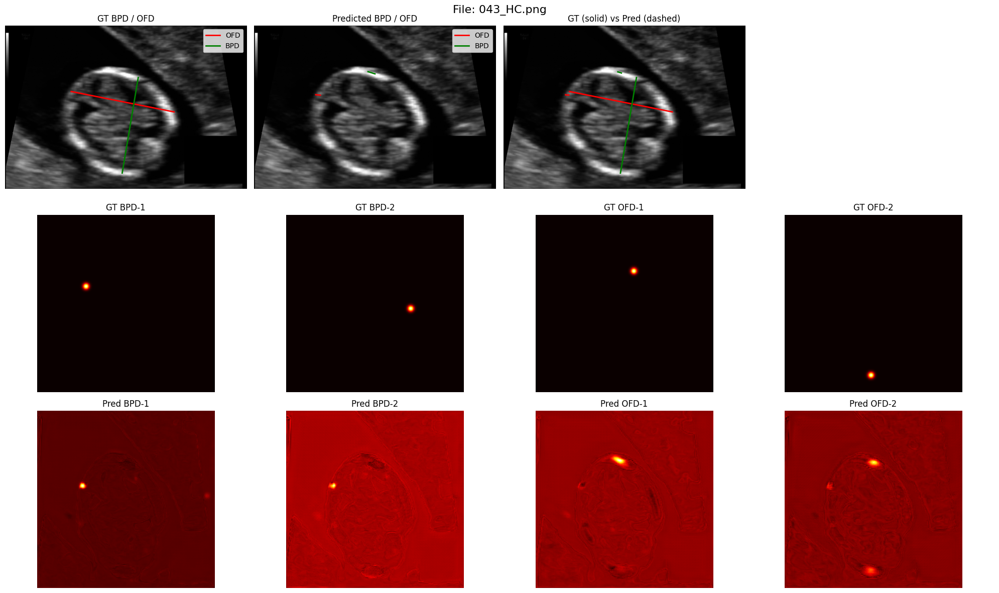

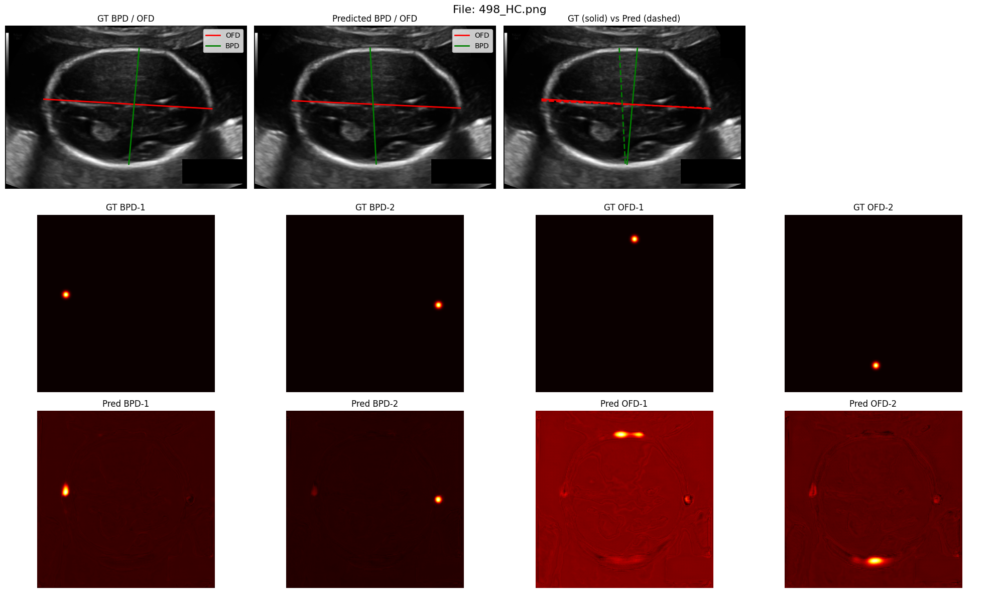

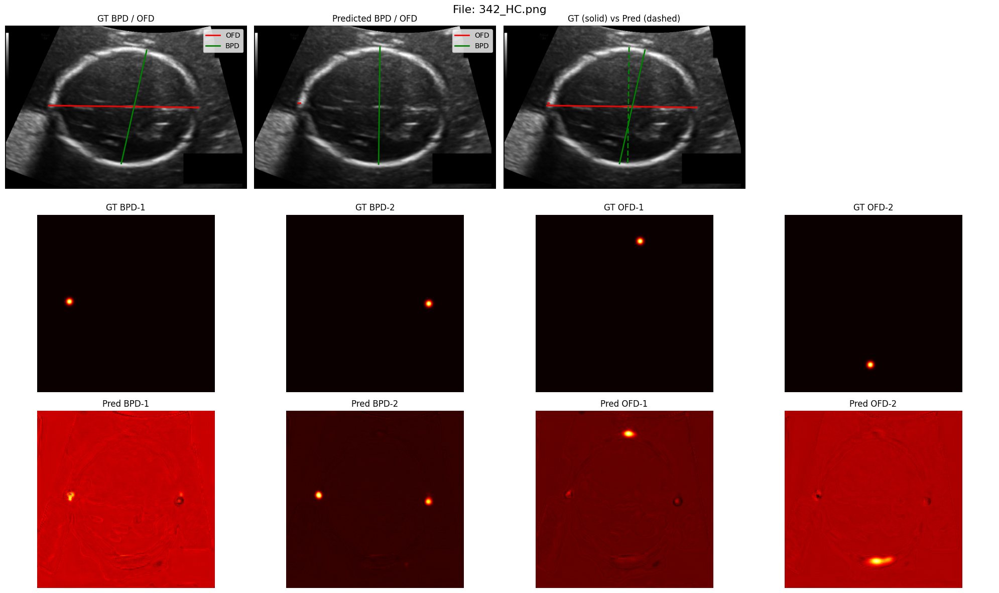

...

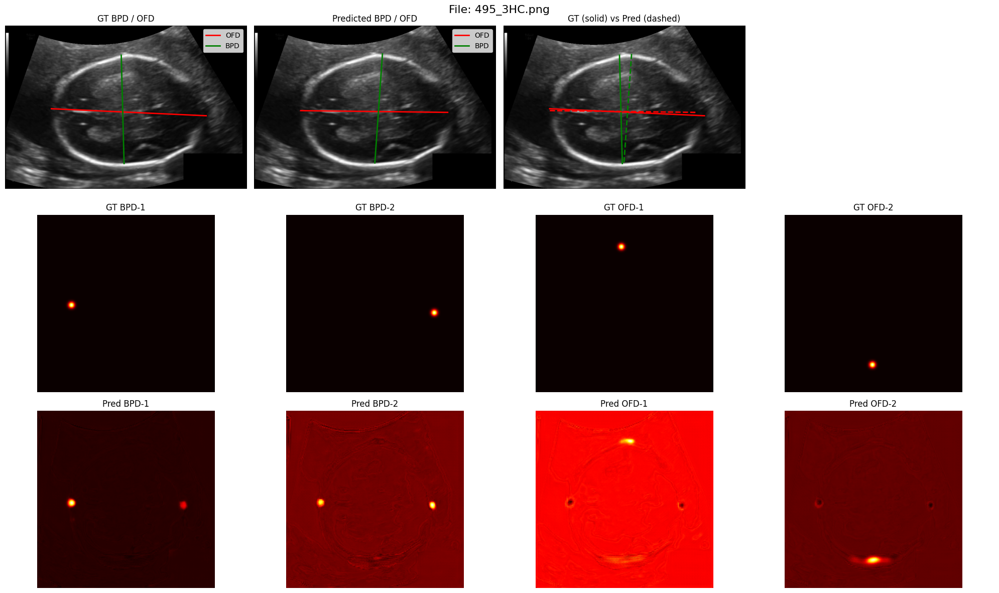

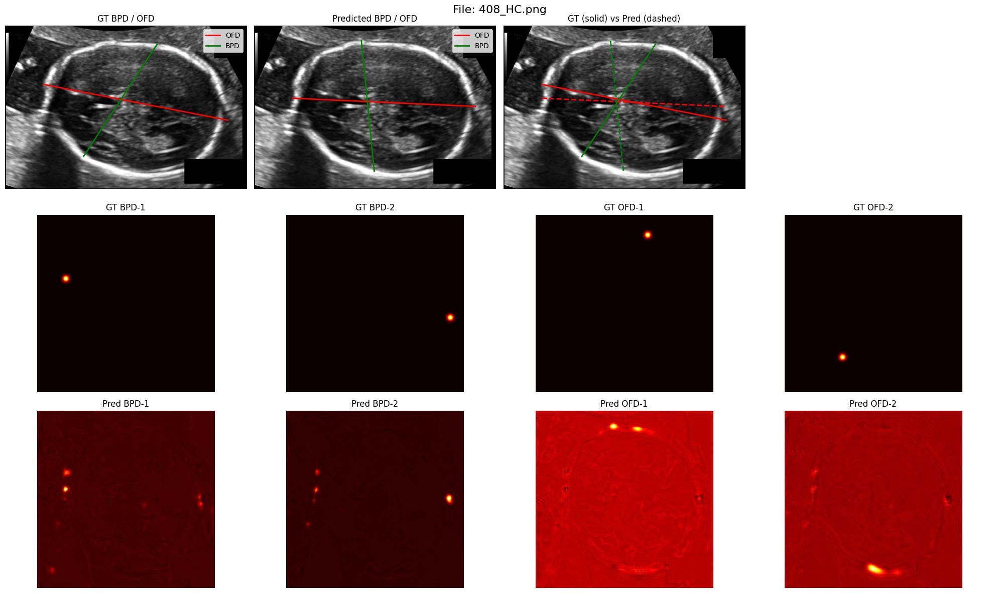

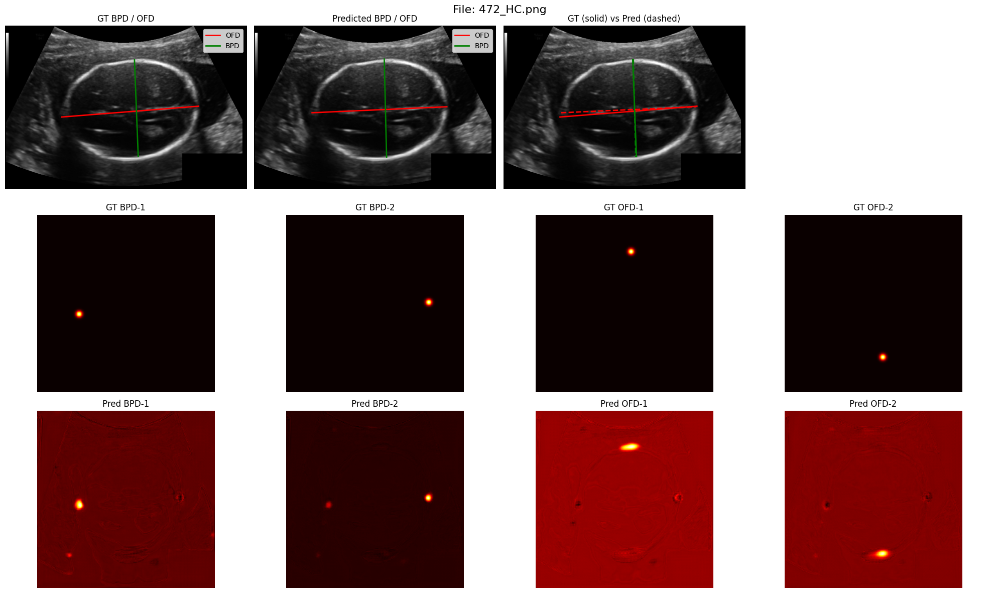

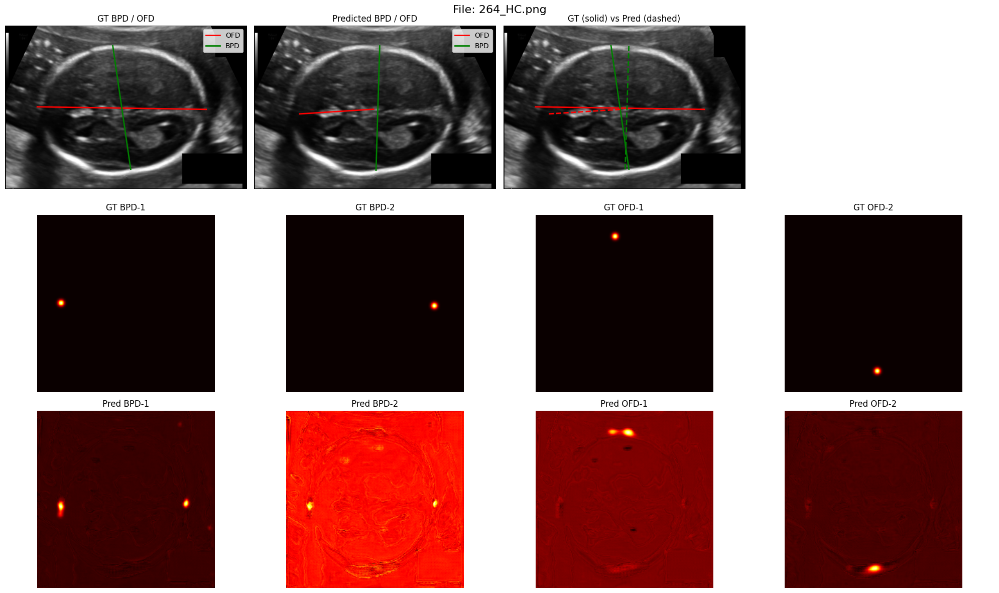

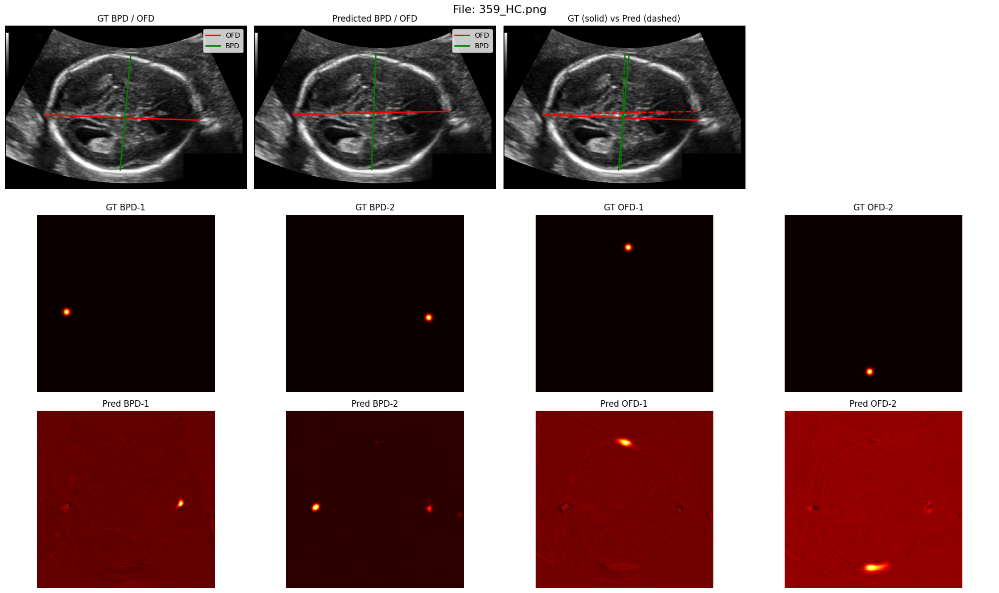

In [113]:
visualize_heatmap_predictions(
    model=model,
    dataset=val_dataset,
    image_dir=IMAGE_DIR,
    device=DEVICE,
    num_images=20
)


In [114]:
import numpy as np
import cv2
from torch.utils.data import DataLoader
import os

def evaluate_heatmap_model(model, dataset, image_dir, device):
    model.eval()
    loader = DataLoader(dataset, batch_size=1, shuffle=False)

    nme_list = []
    results = []

    with torch.no_grad():
        for img, _, name in loader:
            img = img.to(device)

            pred_hm = model(img)

            # FIX: convert to float before scaling
            coords = coords = soft_argmax_2d(pred_hm)[0].cpu().numpy()

            row = dataset.df[dataset.df.image_name == name[0]].iloc[0]
            orig = cv2.imread(os.path.join(image_dir, name[0]), cv2.IMREAD_GRAYSCALE)
            h, w = orig.shape

            sx = w / dataset.img_size
            sy = h / dataset.img_size
            coords[:, 0] *= sx
            coords[:, 1] *= sy

            gt = np.array([
                [row.ofd_1_x, row.ofd_1_y],
                [row.ofd_2_x, row.ofd_2_y],
                [row.bpd_1_x, row.bpd_1_y],
                [row.bpd_2_x, row.bpd_2_y],
            ], dtype=np.float32)

            ofd = np.linalg.norm(gt[0] - gt[1])

            errors = [np.linalg.norm(coords[i] - gt[i]) / ofd for i in range(4)]
            nme = np.mean(errors)

            nme_list.append(nme)
            results.append({
                "image_name": name[0],
                "nme": nme
            })

    avg_nme = float(np.mean(nme_list))
    print(f"Average NME (heatmap): {avg_nme:.4f}")

    return results, avg_nme


In [115]:
heatmap_results, heatmap_nme = evaluate_heatmap_model(
    model,
    val_dataset,
    IMAGE_DIR,
    DEVICE
)


Average NME (heatmap): 0.8228


In [107]:
#print(f"Coordinate regression NME: {coord_nme:.4f}")
print(f"Heatmap regression NME:    {heatmap_nme:.4f}")


Heatmap regression NME:    0.8043


In [91]:
import os
import pandas as pd
import cv2
import matplotlib.pyplot as plt

def plot_labeled_image(image_name, images_dir=IMAGE_DIR, csv_path=CSV_PATH):
    # load csv
    df = pd.read_csv(csv_path)

    # find row for the image
    row = df[df["image_name"] == image_name]
    if row.empty:
        raise ValueError(f"No labels found for {image_name}")

    row = row.iloc[0]

    # load image
    image_path = os.path.join(images_dir, image_name)
    img = cv2.imread(image_path)
    if img is None:
        raise FileNotFoundError(f"Image not found: {image_path}")

    # convert to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # extract points
    ofd_x = [row["ofd_1_x"], row["ofd_2_x"]]
    ofd_y = [row["ofd_1_y"], row["ofd_2_y"]]

    bpd_x = [row["bpd_1_x"], row["bpd_2_x"]]
    bpd_y = [row["bpd_1_y"], row["bpd_2_y"]]

    # plot
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.plot(ofd_x, ofd_y, "r-", linewidth=2, label="OFD")
    plt.plot(bpd_x, bpd_y, "g-", linewidth=2, label="BPD")
    plt.scatter(ofd_x, ofd_y, c="red", s=20)
    plt.scatter(bpd_x, bpd_y, c="green", s=20)
    plt.title(image_name)
    plt.axis("off")
    plt.legend()
    plt.show()


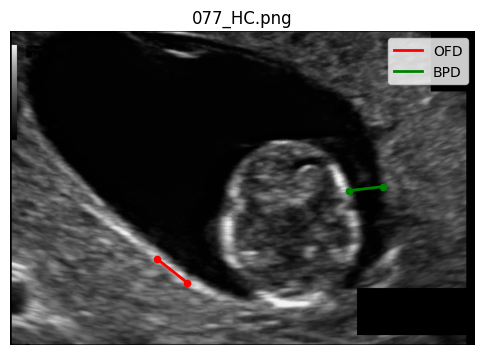

In [124]:
plot_labeled_image("077_HC.png")

In [118]:
import numpy as np
import torch
import cv2
import os

def evaluate_biometry(
    model,
    dataset,
    image_dir,
    device
):
    model.eval()

    gt_bpd, pred_bpd = [], []
    gt_ofd, pred_ofd = [], []

    loader = torch.utils.data.DataLoader(
        dataset, batch_size=1, shuffle=False
    )

    with torch.no_grad():
        for img, _, name in loader:
            img = img.to(device)

            # ---- prediction ----
            pred_hm = model(img)
            pred_coords = soft_argmax_2d(pred_hm)[0].cpu().numpy()

            # ---- load GT landmarks ----
            row = dataset.df[dataset.df.image_name == name[0]].iloc[0]

            gt_coords = np.array([
                [row.bpd_1_x, row.bpd_1_y],
                [row.bpd_2_x, row.bpd_2_y],
                [row.ofd_1_x, row.ofd_1_y],
                [row.ofd_2_x, row.ofd_2_y],
            ], dtype=np.float32)

            # ---- scale predictions back to original image ----
            orig = cv2.imread(
                os.path.join(image_dir, name[0]),
                cv2.IMREAD_GRAYSCALE
            )
            h, w = orig.shape
            sx = w / dataset.img_size
            sy = h / dataset.img_size

            pred_coords[:, 0] *= sx
            pred_coords[:, 1] *= sy

            # ---- compute diameters ----
            def dist(p1, p2):
                return np.linalg.norm(p1 - p2)

            gt_bpd.append(dist(gt_coords[0], gt_coords[1]))
            pred_bpd.append(dist(pred_coords[0], pred_coords[1]))

            gt_ofd.append(dist(gt_coords[2], gt_coords[3]))
            pred_ofd.append(dist(pred_coords[2], pred_coords[3]))

    return (
        np.array(gt_bpd),
        np.array(pred_bpd),
        np.array(gt_ofd),
        np.array(pred_ofd),
    )


In [119]:
def mean_l1(diff):
    return np.mean(np.abs(diff))

def median_l1(diff):
    return np.median(np.abs(diff))

def bias(diff):
    return np.mean(diff)

def bland_altman_limits(diff):
    mean_d = np.mean(diff)
    std_d = np.std(diff, ddof=1)
    return mean_d, mean_d - 1.96 * std_d, mean_d + 1.96 * std_d


In [120]:
gt_bpd, pred_bpd, gt_ofd, pred_ofd = evaluate_biometry(
    model,
    val_dataset,
    IMAGE_DIR,
    DEVICE
)

diff_bpd = gt_bpd - pred_bpd
diff_ofd = gt_ofd - pred_ofd


In [121]:
print("BPD:")
print(" Mean L1:", mean_l1(diff_bpd))
print(" Median L1:", median_l1(diff_bpd))
print(" Bias:", bias(diff_bpd))
print(" 95% agreement:", bland_altman_limits(diff_bpd))

print("\nOFD:")
print(" Mean L1:", mean_l1(diff_ofd))
print(" Median L1:", median_l1(diff_ofd))
print(" Bias:", bias(diff_ofd))
print(" 95% agreement:", bland_altman_limits(diff_ofd))


BPD:
 Mean L1: 218.59323
 Median L1: 253.5532
 Bias: 213.39423
 95% agreement: (np.float32(213.39423), np.float32(-216.90497), np.float32(643.6934))

OFD:
 Mean L1: 21.861738
 Median L1: 3.3332367
 Bias: 14.891738
 95% agreement: (np.float32(14.891738), np.float32(-123.46332), np.float32(153.2468))


In [122]:
import matplotlib.pyplot as plt

def bland_altman_plot(means, diffs, title):
    mean_d = np.mean(diffs)
    std_d = np.std(diffs, ddof=1)

    plt.figure(figsize=(6, 5))
    plt.scatter(means, diffs, alpha=0.6)
    plt.axhline(mean_d, linestyle='--', label='Bias')
    plt.axhline(mean_d + 1.96 * std_d, linestyle='--', label='Upper 95%')
    plt.axhline(mean_d - 1.96 * std_d, linestyle='--', label='Lower 95%')
    plt.xlabel("Mean of GT and Predicted")
    plt.ylabel("GT − Predicted")
    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()


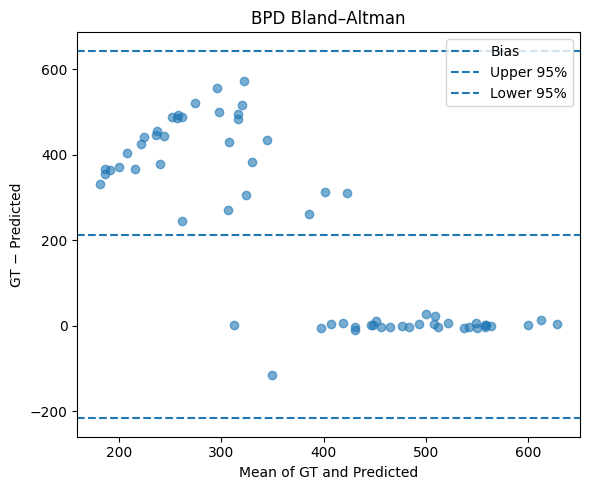

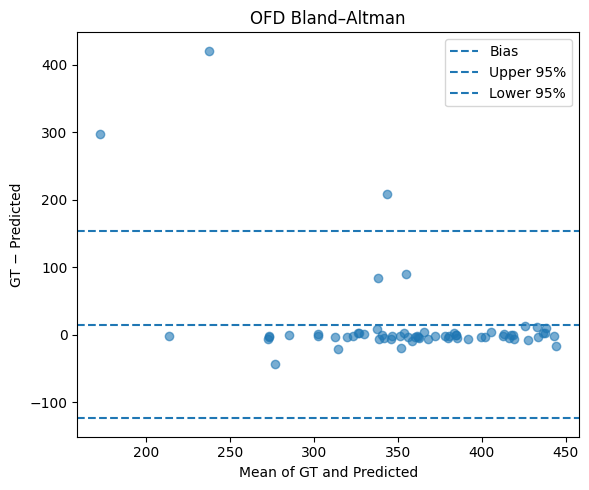

In [123]:
bland_altman_plot(
    (gt_bpd + pred_bpd) / 2,
    diff_bpd,
    "BPD Bland–Altman"
)

bland_altman_plot(
    (gt_ofd + pred_ofd) / 2,
    diff_ofd,
    "OFD Bland–Altman"
)
